In [1]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder, LabelEncoder, MinMaxScaler, MaxAbsScaler, RobustScaler, Normalizer, QuantileTransformer, PowerTransformer
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.impute import SimpleImputer

In [2]:
df = pd.read_csv('../../../data/clean_data/data_clean.csv')

In [2]:
df_missing = pd.read_csv('../../../data/clean_data/data_clean_missing.csv')

In [3]:
df.shape

(40560, 15)

In [114]:
df_missing.head(10)

,artist_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre,duration_ms_imp
0,Röyksopp,27.0,0.00468,0.652,-1.0,0.941,0.792000,A#,0.1150,-5.201,Minor,0.0748,100.889,0.759,Electronic,245503.541466
1,Thievery Corporation,31.0,0.01270,0.622,218293.0,0.890,0.950000,D,0.1240,-7.043,Minor,0.0300,115.00200000000001,0.531,Electronic,218293.000000
2,Dillon Francis,28.0,0.00306,0.620,215613.0,0.755,0.011800,G#,0.5340,-4.617,Major,0.0345,127.994,0.333,Electronic,215613.000000
3,Dubloadz,34.0,0.02540,0.774,166875.0,0.700,0.002530,C#,0.1570,-4.498,Major,0.2390,128.014,0.270,Electronic,166875.000000
4,What So Not,32.0,0.00465,0.638,222369.0,0.587,0.909000,F#,0.1570,-6.266,Major,0.0413,145.036,0.323,Electronic,222369.000000
5,Axel Boman,47.0,0.00523,0.755,519468.0,0.731,0.854000,D,0.2160,-10.517,Minor,0.0412,?,0.614,Electronic,519468.000000
6,Jordan Comolli,46.0,0.02890,0.572,214408.0,0.803,0.000008,B,0.1060,-4.294,Major,0.3510,149.995,0.230,Electronic,214408.000000
7,Hraach,43.0,0.02970,0.809,416132.0,0.706,0.903000,G,0.0635,-9.339,Minor,0.0484,120.008,0.761,Electronic,416132.000000
8,Kayzo,39.0,0.00299,0.509,292800.0,0.921,0.000276,F,0.1780,-3.175,Minor,0.2680,149.94799999999998,0.273,Electronic,292800.000000
9,Shlump,22.0,0.00934,0.578,204800.0,0.731,0.011200,A,0.1110,-7.091,Minor,0.1730,139.933,0.203,Electronic,204800.000000


In [70]:
df[df['artist_name'] == 'Kendrick Lamar']

,artist_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
20504,Kendrick Lamar,59.0,0.2540,0.615,283120.0,0.743,0.000000,C#,0.665,-4.580,Major,0.3250,111.914,0.515,Rap
20726,Kendrick Lamar,57.0,0.0992,0.667,208013.0,0.558,0.000007,E,0.225,-11.341,Minor,0.0433,89.179,0.647,Rap
20781,Kendrick Lamar,58.0,0.2860,0.555,324533.0,0.611,0.001060,A#,0.273,-9.216,Minor,0.3560,94.939,0.411,Rap
21019,Kendrick Lamar,51.0,0.1080,0.593,279147.0,0.731,0.000002,C#,0.103,-5.210,Major,0.1490,160.084,0.610,Rap
21126,Kendrick Lamar,55.0,0.0282,0.652,443413.0,0.458,0.000000,C#,0.664,-12.272,Major,0.1940,100.046,0.174,Rap
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40146,Kendrick Lamar,54.0,0.4860,0.503,273640.0,0.508,0.010200,A#,0.124,-11.094,Minor,0.5200,81.908,0.317,Hip-Hop
40253,Kendrick Lamar,62.0,0.0545,0.631,278800.0,0.791,0.000000,C#,0.226,-5.776,Major,0.2270,133.672,0.123,Hip-Hop
40466,Kendrick Lamar,66.0,0.1370,0.746,214827.0,0.798,0.000000,C,0.139,-8.382,Major,0.3490,109.968,0.553,Hip-Hop
40472,Kendrick Lamar,63.0,0.1790,0.695,279855.0,0.827,0.000000,F#,0.283,-5.742,Minor,0.2820,81.024,0.538,Hip-Hop


In [6]:
pd.set_option('display.max_columns', None)

In [15]:
#look at statistics based on music genre
df.groupby('music_genre').mean()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
music_genre,,,,,,,,,,,
Alternative,50.238213,0.165818,0.543548,233401.847692,0.711347,0.060642,0.196118,-6.526353,0.088907,122.398718,0.448641
Anime,24.273130,0.283650,0.471435,231378.483760,0.667528,0.275696,0.193509,-7.910208,0.064674,126.688628,0.436103
Blues,34.844785,0.312226,0.527317,253432.844291,0.612521,0.093796,0.233495,-8.949297,0.062552,121.296835,0.577852
Classical,29.305253,0.870412,0.306723,310510.827552,0.175664,0.603554,0.162306,-21.629532,0.051597,103.916934,0.210925
Country,46.026920,0.271384,0.576436,216708.237837,0.636880,0.005839,0.185417,-7.323265,0.049078,123.976519,0.537257
Electronic,38.264137,0.124051,0.620173,269823.285714,0.738062,0.351582,0.210307,-7.072186,0.099289,125.775481,0.391775
Hip-Hop,58.397842,0.178435,0.716462,219770.169733,0.647242,0.010464,0.201357,-6.821617,0.206740,119.900795,0.476371
Jazz,40.967766,0.494101,0.584422,264350.728593,0.473662,0.354021,0.172591,-11.182938,0.073962,111.613436,0.507923
Rap,60.589560,0.171080,0.696837,219015.521524,0.650704,0.008686,0.197174,-6.668378,0.187059,120.428165,0.456343


In [16]:
#look at statistics based on music genre
df.groupby('music_genre').median()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
music_genre,,,,,,,,,,,
Alternative,49.0,0.0339,0.541,226207.0,0.7480,0.000067,0.132,-5.9930,0.05230,120.0480,0.432
Anime,23.0,0.0641,0.488,239941.0,0.7840,0.000405,0.137,-5.6850,0.04520,127.9585,0.436
Blues,33.0,0.2030,0.529,230346.5,0.6315,0.000929,0.137,-8.3835,0.04320,118.0940,0.586
Classical,32.0,0.9680,0.302,262676.0,0.0988,0.837500,0.110,-21.9225,0.04330,96.3030,0.140
Country,44.0,0.1830,0.579,211500.0,0.6690,0.000000,0.127,-6.5690,0.03440,123.4110,0.527
Electronic,37.0,0.0262,0.631,244965.5,0.7730,0.186000,0.128,-6.4685,0.05760,125.9685,0.361
Hip-Hop,57.0,0.1070,0.731,215040.0,0.6510,0.000000,0.136,-6.4790,0.19100,120.0550,0.476
Jazz,40.0,0.5095,0.600,247682.0,0.4750,0.121000,0.115,-10.3460,0.04385,104.8005,0.514
Rap,59.0,0.0948,0.714,214533.5,0.6490,0.000000,0.135,-6.3655,0.16150,120.1490,0.448


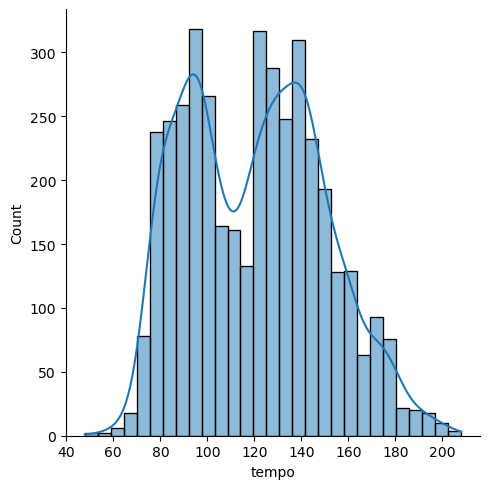

In [42]:
sns.displot(df[df['music_genre'] == 'Rap'], x='tempo', kde= True, rug = False)
plt.show()

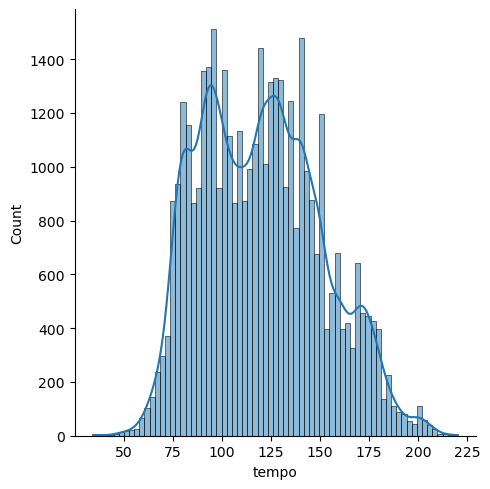

In [78]:
sns.displot(df, x="tempo", kde= True, rug = False)
plt.show()

In [66]:
df[df['duration_ms'] <= 700000].count()

artist_name         40283
popularity          40283
acousticness        40283
danceability        40283
duration_ms         40283
energy              40283
instrumentalness    40283
key                 40283
liveness            40283
loudness            40283
mode                40283
speechiness         40283
tempo               40283
valence             40283
music_genre         40283
dtype: int64

In [3]:
# constrain duration_ms to <= 700,000 ms due to outliers
df_constrain = df_missing[df_missing['duration_ms'] <= 700000]

In [4]:
#replace missing values with nan
df_constrain = df_constrain.replace([-1, '?'], np.nan)

In [158]:
df_constrain.head(10)

,artist_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
0,Röyksopp,27.0,0.00468,0.652,NaN,0.941,0.792000,A#,0.1150,-5.201,Minor,0.0748,100.889,0.759,Electronic
1,Thievery Corporation,31.0,0.01270,0.622,218293.0,0.890,0.950000,D,0.1240,-7.043,Minor,0.0300,115.00200000000001,0.531,Electronic
2,Dillon Francis,28.0,0.00306,0.620,215613.0,0.755,0.011800,G#,0.5340,-4.617,Major,0.0345,127.994,0.333,Electronic
3,Dubloadz,34.0,0.02540,0.774,166875.0,0.700,0.002530,C#,0.1570,-4.498,Major,0.2390,128.014,0.270,Electronic
4,What So Not,32.0,0.00465,0.638,222369.0,0.587,0.909000,F#,0.1570,-6.266,Major,0.0413,145.036,0.323,Electronic
5,Axel Boman,47.0,0.00523,0.755,519468.0,0.731,0.854000,D,0.2160,-10.517,Minor,0.0412,NaN,0.614,Electronic
6,Jordan Comolli,46.0,0.02890,0.572,214408.0,0.803,0.000008,B,0.1060,-4.294,Major,0.3510,149.995,0.230,Electronic
7,Hraach,43.0,0.02970,0.809,416132.0,0.706,0.903000,G,0.0635,-9.339,Minor,0.0484,120.008,0.761,Electronic
8,Kayzo,39.0,0.00299,0.509,292800.0,0.921,0.000276,F,0.1780,-3.175,Minor,0.2680,149.94799999999998,0.273,Electronic
9,Shlump,22.0,0.00934,0.578,204800.0,0.731,0.011200,A,0.1110,-7.091,Minor,0.1730,139.933,0.203,Electronic


In [5]:
# impute duration and tempo columns using the mean strategy
imp_mean = SimpleImputer(strategy='mean')
df_constrain['duration_ms_imp'] = imp_mean.fit_transform(df_constrain[['duration_ms']])

imp_median = SimpleImputer(strategy='median')
df_constrain['tempo_imp'] = imp_median.fit_transform(df_constrain[['tempo']])

In [122]:
df_constrain.head(10)

,artist_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre,duration_ms_imp,tempo_imp
0,Röyksopp,27.0,0.00468,0.652,NaN,0.941,0.792000,A#,0.1150,-5.201,Minor,0.0748,100.889,0.759,Electronic,240367.130393,100.889
1,Thievery Corporation,31.0,0.01270,0.622,218293.0,0.890,0.950000,D,0.1240,-7.043,Minor,0.0300,115.00200000000001,0.531,Electronic,218293.000000,115.002
2,Dillon Francis,28.0,0.00306,0.620,215613.0,0.755,0.011800,G#,0.5340,-4.617,Major,0.0345,127.994,0.333,Electronic,215613.000000,127.994
3,Dubloadz,34.0,0.02540,0.774,166875.0,0.700,0.002530,C#,0.1570,-4.498,Major,0.2390,128.014,0.270,Electronic,166875.000000,128.014
4,What So Not,32.0,0.00465,0.638,222369.0,0.587,0.909000,F#,0.1570,-6.266,Major,0.0413,145.036,0.323,Electronic,222369.000000,145.036
5,Axel Boman,47.0,0.00523,0.755,519468.0,0.731,0.854000,D,0.2160,-10.517,Minor,0.0412,NaN,0.614,Electronic,519468.000000,119.928
6,Jordan Comolli,46.0,0.02890,0.572,214408.0,0.803,0.000008,B,0.1060,-4.294,Major,0.3510,149.995,0.230,Electronic,214408.000000,149.995
7,Hraach,43.0,0.02970,0.809,416132.0,0.706,0.903000,G,0.0635,-9.339,Minor,0.0484,120.008,0.761,Electronic,416132.000000,120.008
8,Kayzo,39.0,0.00299,0.509,292800.0,0.921,0.000276,F,0.1780,-3.175,Minor,0.2680,149.94799999999998,0.273,Electronic,292800.000000,149.948
9,Shlump,22.0,0.00934,0.578,204800.0,0.731,0.011200,A,0.1110,-7.091,Minor,0.1730,139.933,0.203,Electronic,204800.000000,139.933


In [6]:
# drop original columns
df_constrain.drop(['duration_ms', 'tempo'], axis = 1, inplace = True)

In [7]:
# replace Rap with Hip-Hop
df_constrain['music_genre'].replace({'Rap': 'Hip-Hop'}, inplace = True)

In [167]:
df_constrain.music_genre.value_counts()

Hip-Hop        9999
Alternative    5000
Country        5000
Rock           4999
Anime          4992
Electronic     4982
Jazz           4977
Blues          4966
Classical      4781
Name: music_genre, dtype: int64

In [8]:
df_test = df_constrain

In [182]:
df_test[df_test['music_genre'] == 'Hip-Hop'].head()

,artist_name,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,valence,music_genre,duration_ms_imp,tempo_imp
25000,Jeezy,51.0,0.000469,0.683,0.769,0.002260,B,0.303,-7.108,Minor,0.2270,0.475,Hip-Hop,219933.000000,142.827
25001,Smino,63.0,0.354000,0.898,0.677,0.000005,C#,0.449,-6.907,Major,0.3620,0.864,Hip-Hop,240367.130393,155.020
25002,Kid Ink,61.0,0.400000,0.578,0.528,0.000000,G#,0.149,-7.169,Major,0.2740,0.622,Hip-Hop,179533.000000,98.555
25003,Breaking Benjamin,71.0,0.000192,0.543,0.952,0.000008,G#,0.380,-3.650,Major,0.0668,0.591,Hip-Hop,240367.130393,107.942
25004,The Game,17.0,0.003550,0.589,0.721,0.032500,G,0.193,-12.145,Major,0.1930,0.480,Hip-Hop,181441.000000,88.049


In [9]:
# pick random rows of Hip-Hop music genre to re-balance dataset
np.random.seed(10)

remove_n = 5000
drop_indices = np.random.choice(df_test[df_test['music_genre'] == 'Hip-Hop'].index, remove_n, replace=False)
df_subset = df_test.drop(drop_indices)

In [220]:
df_subset.head()

,artist_name,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,valence,music_genre,duration_ms_imp,tempo_imp
0,Röyksopp,27.0,0.00468,0.652,0.941,0.79200,A#,0.115,-5.201,Minor,0.0748,0.759,Electronic,240367.130393,100.889
1,Thievery Corporation,31.0,0.01270,0.622,0.890,0.95000,D,0.124,-7.043,Minor,0.0300,0.531,Electronic,218293.000000,115.002
2,Dillon Francis,28.0,0.00306,0.620,0.755,0.01180,G#,0.534,-4.617,Major,0.0345,0.333,Electronic,215613.000000,127.994
3,Dubloadz,34.0,0.02540,0.774,0.700,0.00253,C#,0.157,-4.498,Major,0.2390,0.270,Electronic,166875.000000,128.014
4,What So Not,32.0,0.00465,0.638,0.587,0.90900,F#,0.157,-6.266,Major,0.0413,0.323,Electronic,222369.000000,145.036


In [184]:
df_subset['music_genre'].count()

44696

In [10]:
# categorize each feature for encoding or scaling
cat_feats = ['artist_name', 'key', 'mode', 'music_genre']
cat_feats_ohe = ['artist_name', 'mode']
cat_feats_le = ['music_genre']

num_feats = ['popularity', 'acousticness','danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']
num_feats_scale = ['popularity', 'duration_ms_imp', 'loudness', 'tempo_imp']
num_feats_imp_mean = ['duration_ms']
num_feats_imp_median = ['tempo']

In [11]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
df_subset[cat_feats_le] = df_subset[cat_feats_le].apply(lambda col: le.fit_transform(col))

In [48]:
# check for string values that mess up XGBoost
contain_values = df_subset[df_subset['artist_name'].str.contains(',')]
contain_values.head()

,artist_name,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,valence,music_genre,duration_ms_imp,tempo_imp
5043,"Hitoshizuku,Yama",17.0,0.027400,0.592,0.969,0.000000,C,0.0914,-1.137,Minor,0.118,0.677,1,194693.000000,107.453
5123,"Hitoshizuku,Yama",19.0,0.003340,0.391,0.954,0.003070,F,0.3010,-2.484,Major,0.148,0.512,1,270000.000000,177.957
5226,"Kami-sama, I have noticed",29.0,0.354000,0.513,0.870,0.000000,C#,0.0828,-4.109,Major,0.188,0.659,1,197546.000000,172.135
5271,"Fear, and Loathing in Las Vegas",24.0,0.000074,0.246,0.989,0.003610,F#,0.3130,-0.468,Major,0.112,0.206,1,441413.000000,99.968
5281,"Kami-sama, I have noticed",35.0,0.052700,0.545,0.975,0.000002,A#,0.0443,-3.232,Minor,0.239,0.489,1,240367.130393,119.928


In [ ]:
# get rid of unwanted values for artist names
df_subset.columns = df_subset.columns.str.translate("".maketrans({"[":"{", "]":"}","<":"^"}))

In [240]:
df_subset.tail()

,artist_name,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,valence,music_genre,duration_ms_imp,tempo_imp
49992,Tee Grizzley,75.0,0.17100,0.587,0.711,0.000000,C#,0.125,-6.330,Major,0.4200,0.381,6,254694.0,98.008
49994,Night Lovell,56.0,0.13300,0.849,0.660,0.000008,C,0.296,-7.195,Major,0.0516,0.629,6,237667.0,99.988
49997,Berner,51.0,0.00597,0.693,0.763,0.000000,D,0.143,-5.443,Major,0.1460,0.395,6,189483.0,131.079
49998,The-Dream,65.0,0.08310,0.782,0.472,0.000000,G,0.106,-5.016,Minor,0.0441,0.354,6,262773.0,75.886
49999,Naughty By Nature,67.0,0.10200,0.862,0.642,0.000000,F#,0.272,-13.652,Minor,0.1010,0.765,6,267267.0,99.201


In [51]:
df_out = pd.get_dummies(df_subset, columns = cat_feats_ohe)

In [243]:
df_out.head()

,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,speechiness,valence,music_genre,duration_ms_imp,tempo_imp,artist_name_!!!,"artist_name_""Weird Al"" Yankovic",artist_name_$NOT,artist_name_$tupid Young,artist_name_$uicideBoy$,artist_name_(Hed) P.E.,artist_name_(Sandy) Alex G,artist_name_03 Greedo,artist_name_04 Limited Sazabys,artist_name_070 Shake,artist_name_10 Years,"artist_name_10,000 Maniacs",artist_name_1000mods,artist_name_10cc,artist_name_11 Acorn Lane,artist_name_112,artist_name_116,artist_name_11:11,artist_name_12 Stones,artist_name_12th Planet,artist_name_164,artist_name_1788-L,artist_name_1K Phew,artist_name_1takejay,artist_name_2 Chainz,artist_name_2 LIVE CREW,artist_name_21 Savage,artist_name_24hrs,artist_name_27CLUB,artist_name_2Pac,artist_name_2nd Exit,artist_name_3 Doors Down,artist_name_3-11 Porter,artist_name_311,artist_name_38 Special,artist_name_3LAU,artist_name_3OH!3,artist_name_3rd Force,artist_name_40mP,artist_name_4B,artist_name_50 Cent,artist_name_6 Dogs,artist_name_641,artist_name_65daysofstatic,artist_name_6LACK,artist_name_6ix9ine,artist_name_6u5,artist_name_7Horse,artist_name_7eventh Time Down,artist_name_808 State,artist_name_88GLAM,artist_name_9th Wonder,artist_name_? & The Mysterians,artist_name_A Boogie Wit da Hoodie,artist_name_A Flock Of Seagulls,artist_name_A Forest Mighty Black,artist_name_A Great Big World,artist_name_A Perfect Circle,artist_name_A R I Z O N A,artist_name_A Rocket To The Moon,artist_name_A Thousand Horses,artist_name_A Tribe Called Quest,artist_name_A$AP ANT,artist_name_A$AP Ferg,artist_name_A$AP Mob,artist_name_A$AP Rocky,artist_name_A$AP Twelvyy,artist_name_A-Trak,artist_name_A.A. Bondy,artist_name_A.CHAL,artist_name_AAA,artist_name_ABRA,artist_name_AC Slater,artist_name_AC/DC,artist_name_AFI,artist_name_AFK,artist_name_AFX,artist_name_AI,artist_name_AIGEL,artist_name_AIMP Nashville,artist_name_AJR,artist_name_AK,artist_name_AK420,artist_name_AKB48,artist_name_ALLBLACK,artist_name_ARMNHMR,artist_name_ASCA,artist_name_ASIAN KUNG-FU GENERATION,artist_name_ATLiens,artist_name_AWOLNATION,artist_name_AZ,artist_name_Aaliyah,artist_name_Aaron Copland,artist_name_Aaron Goldberg,artist_name_Aaron Goodvin,artist_name_Aaron Jay Kernis,artist_name_Aaron Lewis,artist_name_Aaron Pritchett,artist_name_Aaron Shust,artist_name_Aaron Taylor,artist_name_Aaron Tippin,artist_name_Aaron Watson,artist_name_Aaron West & The Roaring Twenties,artist_name_Aazar,artist_name_Ab-Soul,artist_name_Abbey Lincoln,artist_name_Abby Anderson,artist_name_Abel Carlevaro,artist_name_Abner Jay,artist_name_Abstract,artist_name_Abstract Orchestra,artist_name_Academy of Ancient Music,artist_name_Academy of St. Martin in the Fields,artist_name_Accept,artist_name_Acceptance,artist_name_Ace Hood,artist_name_Acid Pauli,artist_name_Acoustic Alchemy,artist_name_Action Bronson,artist_name_Adairs Run,artist_name_Adam Baldych,artist_name_Adam Beyer,artist_name_Adam Calhoun,artist_name_Adam Carroll,artist_name_Adam Craig,artist_name_Adam Doleac,artist_name_Adam Hambrick,artist_name_Adam Jensen,artist_name_Adam Levine,artist_name_Adam Rafferty,artist_name_Adam Sanders,artist_name_Adelitas Way,artist_name_Adema,artist_name_Adrian Marcel,artist_name_Adventure Club,artist_name_Aer,artist_name_Aeris Roves,artist_name_Aerosmith,artist_name_Aesop Rock,artist_name_Afro B,artist_name_Afroman,artist_name_Afterglow,artist_name_Afterlife,artist_name_Aftertheparty,artist_name_Afu-Ra,artist_name_Agustín Barrios Mangoré,artist_name_Ahmad Jamal,artist_name_Ahmad Jamal Trio,artist_name_Ai Otsuka,artist_name_Aim,artist_name_Aimee Mann,artist_name_Aimer,artist_name_Aimi,artist_name_Air,artist_name_Air Supply,artist_name_Airbourne,artist_name_Airways,artist_name_Ajmw,artist_name_Akihiko Matsumoto,artist_name_Akiko Shikata,artist_name_Akira Ifukube,artist_name_Akira Kosemura,artist_name_Akira Senju,artist_name_Akon,artist_name_Akshin Alizadeh,artist_name_Akurei,artist_name_Al Di Meola,artist_name_Al Green,arti

In [204]:
# look at list of unique keys
df_missing['key'].unique()

array(['A#', 'D', 'G#', 'C#', 'F#', 'B', 'G', 'F', 'A', 'C', 'E', 'D#'],
      dtype=object)

In [52]:
# make custom map for key column
dic = {'C': '0', 'C#': '1', 'D': '2', 'D#': '3', 'E': '4',
       'F': '5', 'F#': '6', 'G': '7', 'G#': '8', 'A': '9',
       'A#': '10', 'B': '11'}

In [53]:
# use custom map on key column
df_out.replace({"key": dic}, inplace = True)

In [245]:
df_out.head()

,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,speechiness,valence,music_genre,duration_ms_imp,tempo_imp,artist_name_!!!,"artist_name_""Weird Al"" Yankovic",artist_name_$NOT,artist_name_$tupid Young,artist_name_$uicideBoy$,artist_name_(Hed) P.E.,artist_name_(Sandy) Alex G,artist_name_03 Greedo,artist_name_04 Limited Sazabys,artist_name_070 Shake,artist_name_10 Years,"artist_name_10,000 Maniacs",artist_name_1000mods,artist_name_10cc,artist_name_11 Acorn Lane,artist_name_112,artist_name_116,artist_name_11:11,artist_name_12 Stones,artist_name_12th Planet,artist_name_164,artist_name_1788-L,artist_name_1K Phew,artist_name_1takejay,artist_name_2 Chainz,artist_name_2 LIVE CREW,artist_name_21 Savage,artist_name_24hrs,artist_name_27CLUB,artist_name_2Pac,artist_name_2nd Exit,artist_name_3 Doors Down,artist_name_3-11 Porter,artist_name_311,artist_name_38 Special,artist_name_3LAU,artist_name_3OH!3,artist_name_3rd Force,artist_name_40mP,artist_name_4B,artist_name_50 Cent,artist_name_6 Dogs,artist_name_641,artist_name_65daysofstatic,artist_name_6LACK,artist_name_6ix9ine,artist_name_6u5,artist_name_7Horse,artist_name_7eventh Time Down,artist_name_808 State,artist_name_88GLAM,artist_name_9th Wonder,artist_name_? & The Mysterians,artist_name_A Boogie Wit da Hoodie,artist_name_A Flock Of Seagulls,artist_name_A Forest Mighty Black,artist_name_A Great Big World,artist_name_A Perfect Circle,artist_name_A R I Z O N A,artist_name_A Rocket To The Moon,artist_name_A Thousand Horses,artist_name_A Tribe Called Quest,artist_name_A$AP ANT,artist_name_A$AP Ferg,artist_name_A$AP Mob,artist_name_A$AP Rocky,artist_name_A$AP Twelvyy,artist_name_A-Trak,artist_name_A.A. Bondy,artist_name_A.CHAL,artist_name_AAA,artist_name_ABRA,artist_name_AC Slater,artist_name_AC/DC,artist_name_AFI,artist_name_AFK,artist_name_AFX,artist_name_AI,artist_name_AIGEL,artist_name_AIMP Nashville,artist_name_AJR,artist_name_AK,artist_name_AK420,artist_name_AKB48,artist_name_ALLBLACK,artist_name_ARMNHMR,artist_name_ASCA,artist_name_ASIAN KUNG-FU GENERATION,artist_name_ATLiens,artist_name_AWOLNATION,artist_name_AZ,artist_name_Aaliyah,artist_name_Aaron Copland,artist_name_Aaron Goldberg,artist_name_Aaron Goodvin,artist_name_Aaron Jay Kernis,artist_name_Aaron Lewis,artist_name_Aaron Pritchett,artist_name_Aaron Shust,artist_name_Aaron Taylor,artist_name_Aaron Tippin,artist_name_Aaron Watson,artist_name_Aaron West & The Roaring Twenties,artist_name_Aazar,artist_name_Ab-Soul,artist_name_Abbey Lincoln,artist_name_Abby Anderson,artist_name_Abel Carlevaro,artist_name_Abner Jay,artist_name_Abstract,artist_name_Abstract Orchestra,artist_name_Academy of Ancient Music,artist_name_Academy of St. Martin in the Fields,artist_name_Accept,artist_name_Acceptance,artist_name_Ace Hood,artist_name_Acid Pauli,artist_name_Acoustic Alchemy,artist_name_Action Bronson,artist_name_Adairs Run,artist_name_Adam Baldych,artist_name_Adam Beyer,artist_name_Adam Calhoun,artist_name_Adam Carroll,artist_name_Adam Craig,artist_name_Adam Doleac,artist_name_Adam Hambrick,artist_name_Adam Jensen,artist_name_Adam Levine,artist_name_Adam Rafferty,artist_name_Adam Sanders,artist_name_Adelitas Way,artist_name_Adema,artist_name_Adrian Marcel,artist_name_Adventure Club,artist_name_Aer,artist_name_Aeris Roves,artist_name_Aerosmith,artist_name_Aesop Rock,artist_name_Afro B,artist_name_Afroman,artist_name_Afterglow,artist_name_Afterlife,artist_name_Aftertheparty,artist_name_Afu-Ra,artist_name_Agustín Barrios Mangoré,artist_name_Ahmad Jamal,artist_name_Ahmad Jamal Trio,artist_name_Ai Otsuka,artist_name_Aim,artist_name_Aimee Mann,artist_name_Aimer,artist_name_Aimi,artist_name_Air,artist_name_Air Supply,artist_name_Airbourne,artist_name_Airways,artist_name_Ajmw,artist_name_Akihiko Matsumoto,artist_name_Akiko Shikata,artist_name_Akira Ifukube,artist_name_Akira Kosemura,artist_name_Akira Senju,artist_name_Akon,artist_name_Akshin Alizadeh,artist_name_Akurei,artist_name_Al Di Meola,artist_name_Al Green,arti

In [54]:
# Scale numerical features that need to be scaled
scaler = StandardScaler()

df_out[num_feats_scale] = scaler.fit_transform(df_subset[num_feats_scale])


In [248]:
df_out.tail(10)

,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,speechiness,valence,music_genre,duration_ms_imp,tempo_imp,artist_name_!!!,"artist_name_""Weird Al"" Yankovic",artist_name_$NOT,artist_name_$tupid Young,artist_name_$uicideBoy$,artist_name_(Hed) P.E.,artist_name_(Sandy) Alex G,artist_name_03 Greedo,artist_name_04 Limited Sazabys,artist_name_070 Shake,artist_name_10 Years,"artist_name_10,000 Maniacs",artist_name_1000mods,artist_name_10cc,artist_name_11 Acorn Lane,artist_name_112,artist_name_116,artist_name_11:11,artist_name_12 Stones,artist_name_12th Planet,artist_name_164,artist_name_1788-L,artist_name_1K Phew,artist_name_1takejay,artist_name_2 Chainz,artist_name_2 LIVE CREW,artist_name_21 Savage,artist_name_24hrs,artist_name_27CLUB,artist_name_2Pac,artist_name_2nd Exit,artist_name_3 Doors Down,artist_name_3-11 Porter,artist_name_311,artist_name_38 Special,artist_name_3LAU,artist_name_3OH!3,artist_name_3rd Force,artist_name_40mP,artist_name_4B,artist_name_50 Cent,artist_name_6 Dogs,artist_name_641,artist_name_65daysofstatic,artist_name_6LACK,artist_name_6ix9ine,artist_name_6u5,artist_name_7Horse,artist_name_7eventh Time Down,artist_name_808 State,artist_name_88GLAM,artist_name_9th Wonder,artist_name_? & The Mysterians,artist_name_A Boogie Wit da Hoodie,artist_name_A Flock Of Seagulls,artist_name_A Forest Mighty Black,artist_name_A Great Big World,artist_name_A Perfect Circle,artist_name_A R I Z O N A,artist_name_A Rocket To The Moon,artist_name_A Thousand Horses,artist_name_A Tribe Called Quest,artist_name_A$AP ANT,artist_name_A$AP Ferg,artist_name_A$AP Mob,artist_name_A$AP Rocky,artist_name_A$AP Twelvyy,artist_name_A-Trak,artist_name_A.A. Bondy,artist_name_A.CHAL,artist_name_AAA,artist_name_ABRA,artist_name_AC Slater,artist_name_AC/DC,artist_name_AFI,artist_name_AFK,artist_name_AFX,artist_name_AI,artist_name_AIGEL,artist_name_AIMP Nashville,artist_name_AJR,artist_name_AK,artist_name_AK420,artist_name_AKB48,artist_name_ALLBLACK,artist_name_ARMNHMR,artist_name_ASCA,artist_name_ASIAN KUNG-FU GENERATION,artist_name_ATLiens,artist_name_AWOLNATION,artist_name_AZ,artist_name_Aaliyah,artist_name_Aaron Copland,artist_name_Aaron Goldberg,artist_name_Aaron Goodvin,artist_name_Aaron Jay Kernis,artist_name_Aaron Lewis,artist_name_Aaron Pritchett,artist_name_Aaron Shust,artist_name_Aaron Taylor,artist_name_Aaron Tippin,artist_name_Aaron Watson,artist_name_Aaron West & The Roaring Twenties,artist_name_Aazar,artist_name_Ab-Soul,artist_name_Abbey Lincoln,artist_name_Abby Anderson,artist_name_Abel Carlevaro,artist_name_Abner Jay,artist_name_Abstract,artist_name_Abstract Orchestra,artist_name_Academy of Ancient Music,artist_name_Academy of St. Martin in the Fields,artist_name_Accept,artist_name_Acceptance,artist_name_Ace Hood,artist_name_Acid Pauli,artist_name_Acoustic Alchemy,artist_name_Action Bronson,artist_name_Adairs Run,artist_name_Adam Baldych,artist_name_Adam Beyer,artist_name_Adam Calhoun,artist_name_Adam Carroll,artist_name_Adam Craig,artist_name_Adam Doleac,artist_name_Adam Hambrick,artist_name_Adam Jensen,artist_name_Adam Levine,artist_name_Adam Rafferty,artist_name_Adam Sanders,artist_name_Adelitas Way,artist_name_Adema,artist_name_Adrian Marcel,artist_name_Adventure Club,artist_name_Aer,artist_name_Aeris Roves,artist_name_Aerosmith,artist_name_Aesop Rock,artist_name_Afro B,artist_name_Afroman,artist_name_Afterglow,artist_name_Afterlife,artist_name_Aftertheparty,artist_name_Afu-Ra,artist_name_Agustín Barrios Mangoré,artist_name_Ahmad Jamal,artist_name_Ahmad Jamal Trio,artist_name_Ai Otsuka,artist_name_Aim,artist_name_Aimee Mann,artist_name_Aimer,artist_name_Aimi,artist_name_Air,artist_name_Air Supply,artist_name_Airbourne,artist_name_Airways,artist_name_Ajmw,artist_name_Akihiko Matsumoto,artist_name_Akiko Shikata,artist_name_Akira Ifukube,artist_name_Akira Kosemura,artist_name_Akira Senju,artist_name_Akon,artist_name_Akshin Alizadeh,artist_name_Akurei,artist_name_Al Di Meola,artist_name_Al Green,arti

In [55]:
#Check for missing data
def check_null(data):
    total = data.isnull().sum().sort_values(ascending=False)
    percent = ((data.isnull().sum()/data.isnull().count()).sort_values(ascending=False))*100
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    return missing_data

In [56]:
df_out.shape

(44696, 6657)

In [57]:
check_null(df_out)

,Total,Percent
popularity,0,0.0
artist_name_Layo & Bushwacka!,0,0.0
artist_name_Phoebe Snow,0,0.0
artist_name_Phoebe Bridgers,0,0.0
artist_name_Phish,0,0.0
...,...,...
artist_name_Gov't Mule,0,0.0
artist_name_Goth Babe,0,0.0
"artist_name_Gotay ""El Autentiko""",0,0.0
artist_name_Gotan Project,0,0.0


In [58]:
#export dataframe as a csv
df_out.to_csv('../../../data/clean_data/data_scaled.csv', index=False)